In [1]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


## **SETUP ENVIROMENT**

In [2]:
# @title
!git clone https://github.com/IDEA-Research/GroundingDINO.git

Cloning into 'GroundingDINO'...
remote: Enumerating objects: 401, done.
remote: Counting objects: 100% (77/77), done.
remote: Compressing objects: 100% (33/33), done.
remote: Total 401 (delta 52), reused 44 (delta 44), pack-reused 324
Receiving objects: 100% (401/401), 12.84 MiB | 29.62 MiB/s, done.
Resolving deltas: 100% (205/205), done.


In [3]:
# @title
%cd /content/GroundingDINO
import os
CONFIG_PATH = os.path.join(os.getcwd(), 'groundingdino/config/GroundingDINO_SwinT_OGC.py')

/content/GroundingDINO


In [4]:
# @title
!pip install -q -e .

  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.7/7.7 MB 53.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 254.7/254.7 kB 27.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 76.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 295.0/295.0 kB 31.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 87.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.8/3.8 MB 104.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 268.8/268.8 kB 27.5 MB/s eta 0:00:00


In [5]:
# @title
!wget -q https://github.com/IDEA-Research/GroundingDINO/releases/download/v0.1.0-alpha/groundingdino_swint_ogc.pth

In [6]:
# @title
from groundingdino.util.inference import load_model, load_image, predict, annotate
import supervision as sv
WEIGHT = 'groundingdino_swint_ogc.pth'
# model = load_model(CONFIG_PATH, WEIGHT)

## **Declare CONSTANT variable and necessary function**

In [7]:
people = {
    "person": 122,
    "man": 0,
    "woman": 1,
    "traffic police": 2,
    "beard": 3,
    "muscle": 4,
    "teeth": 5,
    "hand": 6,
}

vehicle = {
    "bicycle": 7,
    "motorcycle": 8,
    "car": 9,
    "bus": 10,
    "train": 11,
    "truck": 12,
    "boat": 13,
    "traffic light": 14,
    "stop sign": 15,
    "fire hydrant": 16,
    "license plate": 17,
}

animal = {
    "bird": 18,
    "cat": 19,
    "dog": 20,
    "horse": 21,
    "sheep": 22,
    "cow": 23,
    "elephant": 24,
    "bear": 25,
    "zebra": 26,
    "giraffe": 27,
    "dolphin": 28,
    "chicken": 29,
    "turtle": 30,
    "monkey": 31,
}

necessity = {
    "backpack": 32,
    "handbag": 33,
    "suitcase": 34,
    "umbrella": 35,
    "tie": 36,
    "necklace": 37,
    "sunglasses": 38,
    "pants": 39,
    "dress": 40,
    "hat": 41,
    "mask": 42,
    "watch": 43,
    "bracelet": 44,
    "shirt": 45,
    "uniform": 46,
}

sports = {
    "sports ball": 47,
    "baseball bat": 48,
    "glove": 49,
    "skateboard": 50,
    "surfboard": 51,
    "tennis racket": 52,
    "frisbee": 53,
    "kite": 54,
    "shoes": 55,
    "sandals": 56,
}

food = {
    "banana": 57,
    "apple": 58,
    "sandwich": 59,
    "orange": 60,
    "broccoli": 61,
    "carrot": 62,
    "hot dog": 63,
    "pizza": 64,
    "donut": 65,
    "cake": 66,
    "box": 67,
}

beverage = {
    "bottle": 68,
    "wine glass": 69,
    "cup": 70,
    "can": 71,
}

scene = {
    "house": 72,
    "apartment": 73, #Thay thế cho building vì ko phân biệt được với house
    "stair": 74,
    "statue": 75,
    "river": 76,
    "rock": 77,
}

job = {
    "engineer": 78,
    "dancer": 79,
    "driver": 80,
    "normal police": 81,
    "doctor": 82,
}

equipment = {
    "fork": 83,
    "knife": 84,
    "spoon": 85,
    "bowl": 86,
    "chair": 87,
    "bench": 88,
    "bed": 89,
    "dining table": 90,
    "toilet": 91,
    "television": 92,
    "refrigerator": 93,
    "vase": 94,
    "plate": 95,
    "scissors": 96,
    "hair drier": 97,
    "toothbrush": 98,
    "towel": 99,
    "oven": 100,
    "microwave": 101,
    "basket": 102,
}

other = {
    "key": 103,
    "microphone": 104,
    "flag": 105,
    "computer": 106,
    "cell phone": 107,
    "mouse": 108,
    "keyboard": 109,
    "remote": 110,
    "laptop": 111,
    "potted plant": 112,
    "clock": 113,
    "flashlight": 114,
    "bulb": 115,
    "guitar": 116,
    "drum": 117,
    "machine": 118,
    "pen": 119,
    "vietnamese text": 120,
    "pig": 121,
}

In [49]:
object_prompt_dict = {
    "person": "person", #0.35
    "person_1": "man . beard . bottle . woman . hat . watch", # 0.35
    "person_2": "muscle . teeth . banana . sandwich . apple . wine glass . bulb . hand", # 0.25
    "vehicle_1": "bicycle . boat . bus . fire hydrant . cup . train . mask", # 0.3
    "vehicle_2": "car . motorcycle . stop sign . traffic light . truck . kite . license plate", # 0.32
    "job": "engineer . traffic police . driver . dancer . normal police . doctor", #0.3
    "animal_1": "bear . monkey . sheep . elephant . horse . turtle . giraffe", # 0.3
    "animal_2": "bird . dog . zebra . dolphin . chicken . cow . cat", #0.25
    "necessity": "shirt . backpack . bracelet . necklace . tie . suitcase . dress . pants . handbag . umbrella . sunglasses . towel . toothbrush . uniform", #0.25
    "food": "orange . box . can . spoon . cake . broccoli . hot dog . fork . pizza . donut . carrot . dining table . plate . bowl . knife", # 0.25
    "furniture": "basket . scissors . microwave . shoes . bench . chair . bed . sandals . oven . vase . television", #0.3
    "scene": "river . house . stair . statue . pig . flag . rock . vietnamese text . sports ball . computer . apartment", # 0.35
    "other_1": "skateboard . baseball bat . glove . potted plant . tennis racket . frisbee . surfboard . clock . flashlight . pen", #0.25
    "other_2": "key . cell phone . laptop . remote . keyboard . mouse . microphone . toilet . refrigerator . guitar . drum . machine . hair drier" #0.3
}

box_threshold = {
    "person": 0.35,
    "person_1": 0.35,
    "person_2": 0.25,
    "vehicle_1": 0.3,
    "vehicle_2": 0.32,
    "job": 0.3,
    "animal_1": 0.3,
    "animal_2": 0.25,
    "necessity": 0.25,
    "food": 0.25,
    "furniture": 0.3,
    "scene": 0.35,
    "other_1": 0.25,
    "other_2": 0.3,
}

TEXT_THRESHOLD = 0.25

123
['apple', 'apartment', 'beard', 'bottle', 'banana', 'bulb', 'bicycle', 'boat', 'bus', 'bear', 'bird', 'backpack', 'bracelet', 'box', 'broccoli', 'bowl', 'basket', 'bench', 'bed', 'baseball bat', 'cup', 'car', 'chicken', 'cow', 'cat', 'can', 'cake', 'carrot', 'chair', 'computer', 'clock', 'cell phone', 'dancer', 'driver', 'doctor', 'dog', 'dolphin', 'dress', 'donut', 'dining table', 'drum', 'engineer', 'elephant', 'fire hydrant', 'fork', 'flag', 'frisbee', 'flashlight', 'giraffe', 'glove', 'guitar', 'hat', 'hand', 'horse', 'handbag', 'hot dog', 'house', 'hair drier', 'kite', 'knife', 'key', 'keyboard', 'license plate', 'laptop', 'man', 'muscle', 'mask', 'motorcycle', 'monkey', 'microwave', 'mouse', 'microphone', 'machine', 'normal police', 'necklace', 'orange', 'oven', 'person', 'pants', 'pizza', 'plate', 'pig', 'potted plant', 'pen', 'river', 'rock', 'remote', 'refrigerator', 'sandwich', 'stop sign', 'sheep', 'shirt', 'suitcase', 'sunglasses', 'spoon', 'scissors', 'shoes', 'sandals

In [143]:
def count_phrases(phrases, dictionary):
    """
        phrases truyền vào phải được xử lý sạch sẽ và nằm trong object_dictionary
        dictionary là object được khai báo toàn bộ object và khởi tạo giá trị đếm bằng 0
    """
    # print(f"\033[0m{phrases}")
    for phrase in phrases:
        if phrase not in dictionary:
            continue
        dictionary[phrase] += 1
    return dictionary

def initial_object(object_lst):
    return {x: 0 for x in object_lst}

## **KIỂM TRA LẠI TẤT CẢ MỌI THỨ TRƯỚC KHI CHẠY**

### **KIỂM TRA TOÀN BỘ OBJECT TRONG 1 DICTIONARY**

In [ ]:
from itertools import chain
merged_dict = list(chain(people.items(), vehicle.items(), animal.items(), necessity.items(), sports.items(), food.items(), beverage.items(), scene.items(), job.items(), equipment.items(), other.items()))

OBJECTS_DICT = dict(merged_dict)
OBJECT_LIST = [x for x in OBJECTS_DICT.keys()]

In [ ]:
print(OBJECTS_DICT)

In [ ]:
print(f"Len: {len(OBJECT_LIST)}, Object List: {OBJECT_LIST}")

### **KIỂM TRA TOÀN BỘ OBJECT CÓ TRONG PROMPT_LIST**

In [ ]:
OBJECT_LIST_FROM_PROMPT = []
for (key, value) in object_prompt_dict.items():
    OBJECT_LIST_FROM_PROMPT += object_prompt_dict[key].split(' . ')
print(len(OBJECT_LIST_FROM_PROMPT))
print(sorted(OBJECT_LIST_FROM_PROMPT, key=lambda x: ord(x[0])))

### **KIỂM TRA XEM OBJECT CÓ TRONG PROMPT CÓ NẰM TRONG DICTIONARY KHÔNG VÀ NGƯỢC LẠI**

In [122]:
for x in OBJECT_LIST_FROM_PROMPT:
    if x not in OBJECT_LIST:
        print(x)

for x in OBJECT_LIST:
    if x not in OBJECT_LIST_FROM_PROMPT:
        print(x)

# Nếu không in ra gì cả thì hai object hoàn toàn khớp

### **Kiểm tra hàm *initial_object()***

In [ ]:
print(initial_object(OBJECT_LIST))

### **Kiểm tra hàm *_get_DINO_output()* bên trong Class**

In [131]:
def process_output(boxes, logits, phrases):
    """
        Xử lý trường hợp phrase bị gán ghép nhãn: VD: man woman, beard hand, vietnamese text statue
    """

    def process_phrase(phrase):
        """
            Hàm xử lý phrase đơn, trường hợp phrase bị gộp thì tách phrase ra (Dùng chung cropped image)
        """
        if phrase == "":
            return None
        elif phrase in OBJECT_LIST:
            return [phrase]
        else:
            if len(phrase.split(' ')) == 1:
                return None
            elif len(phrase.split(' ')) == 2:
                return phrase.split(' ')
            elif len(phrase.split(' ')) == 3:
                obj_lst =  phrase.split(' ')
                obj_1 = obj_lst[0] + ' ' + obj_lst[1]
                obj_2 = obj_lst[2]
                if obj_1 not in OBJECT_LIST:
                    obj_1 = obj_lst[0]
                    obj_2 = obj_lst[1] + ' ' + obj_lst[2]
                if obj_2 not in OBJECT_LIST:
                    obj_1 = obj_lst[0]
                    obj_2 = obj_lst[1]
                    obj_3 = obj_lst[2]
                    return [obj_1, obj_2, obj_3]
                return [obj_1, obj_2]
            else: #len = 4
                obj_lst = phrase.split(' ')
                obj_1 = obj_lst[0] + ' ' + obj_lst[1]
                obj_2 = obj_lst[2] + ' ' + obj_lst[3]
                if obj_1 not in OBJECT_LIST:
                    if obj_2 not in OBJECT_LIST:
                        return [obj_lst[0], obj_lst[1], obj_lst[2]]
                    else:
                        return [obj_lst[0], obj_lst[1], obj_2]
                if obj_2 not in OBJECT_LIST:
                    return [obj_lst[2], obj_lst[3], obj_1]
                return [obj_1, obj_2]

    new_boxes, new_logits, new_phrases = [], [], []
    for idx, phrase in enumerate(phrases):
        phrase_lst = process_phrase(phrase)
        if phrase_lst is None:
            continue
        if len(phrase_lst) == 1:
            new_boxes.append(boxes[idx])
            new_logits.append(logits[idx])
            new_phrases.append(phrase_lst[0])
            # continue
        elif len(phrase_lst) == 2:
            new_boxes.append(boxes[idx])
            new_boxes.append(boxes[idx])

            new_logits.append(logits[idx])
            new_logits.append(logits[idx])

            new_phrases.append(phrase_lst[0])
            new_phrases.append(phrase_lst[1])
        elif len(phrase_lst) == 3:
            new_boxes.append(boxes[idx])
            new_boxes.append(boxes[idx])
            new_boxes.append(boxes[idx])

            new_logits.append(logits[idx])
            new_logits.append(logits[idx])
            new_logits.append(logits[idx])

            new_phrases.append(phrase_lst[0])
            new_phrases.append(phrase_lst[1])
            new_phrases.append(phrase_lst[2])
    return new_boxes, new_logits, new_phrases


In [130]:
sample_phrases = ['person', 'engineer dancer docter', 'cat car', 'vietnamese text traffic police', 'normal police traffic police', '', 'hand', 'handbag', 'hand handbag']
print(process_output(sample_phrases, sample_phrases, sample_phrases)[2])

['person', 'engineer', 'dancer', 'docter', 'cat', 'car', 'vietnamese text', 'traffic police', 'normal police', 'traffic police', 'hand', 'handbag', 'hand', 'handbag']


### **KIỂM TRA LƯU FILE CSV SAU KHI THU ĐƯỢC DICTIONARY ĐẾM SỐ LƯỢNG OBJECT**

In [150]:
import csv
import os

data = [
    {"index": 1, "img_p": '23.jpg', "apple": 2, 'person': 5},
    {"index": 2, "img_p": '24.jpg', "apple": 3, 'person': 7},
    {"index": 3, "img_p": '25.jpg', "apple": 4, 'person': 7},
    {"index": 31, "img_p": '212.jpg', "apple": 41, 'person': 7},
    {"index": 32, "img_p": '123.jpg', "apple": 24, 'person': 7},
    {"index": 33, "img_p": '22.jpg', "apple": 23, 'person': 2},
    {"index": 34, "img_p": '235.jpg', "apple": 2, 'person': 7},
    {"index": 35, "img_p": '253.jpg', "apple": 2, 'person': 7},
    {"index": 36, "img_p": '90.jpg', "apple": 33, 'person': 4},
    {"index": 37, "img_p": '74.jpg', "apple": 43, 'person': 7},
    {"index": 38, "img_p": '245.jpg', "apple": 9, 'person': 6},

]

# Đường dẫn và tên file CSV
file_path = "/content/data.csv"

# Kiểm tra xem file CSV đã tồn tại hay chưa
file_exists = os.path.isfile(file_path)

# Ghi dữ liệu vào file CSV
with open(file_path, mode="w", newline="") as file:
    writer = csv.DictWriter(file, fieldnames=data[0].keys())

    # Ghi tiêu đề cột
    writer.writeheader()

    # Ghi dữ liệu từ danh sách vào file CSV
    writer.writerows(data)

print("Dữ liệu đã được ghi đè và lưu vào file CSV thành công.")

Dữ liệu đã được ghi đè và lưu vào file CSV thành công.


In [151]:
import pandas as pd
sample_df = pd.read_csv('/content/data.csv')
sample_df.head(10)

,index,img_p,apple,person
0,1,23.jpg,2,5
1,2,24.jpg,3,7
2,3,25.jpg,4,7
3,31,212.jpg,41,7
4,32,123.jpg,24,7
5,33,22.jpg,23,2
6,34,235.jpg,2,7
7,35,253.jpg,2,7
8,36,90.jpg,33,4
9,37,74.jpg,43,7


## **FINAL**

In [144]:
object_prompt_list = [(value, box_threshold[key], TEXT_THRESHOLD) for key, value in object_prompt_dict.items()]

In [145]:
print(object_prompt_list)

[('person', 0.35, 0.25), ('man . beard . bottle . woman . hat . watch', 0.35, 0.25), ('muscle . teeth . banana . sandwich . apple . wine glass . bulb . hand', 0.25, 0.25), ('bicycle . boat . bus . fire hydrant . cup . train . mask', 0.3, 0.25), ('car . motorcycle . stop sign . traffic light . truck . kite . license plate', 0.32, 0.25), ('traffic police . engineer . dancer . driver . normal police . doctor', 0.3, 0.25), ('bear . monkey . sheep . elephant . horse . turtle . giraffe', 0.3, 0.25), ('bird . dog . zebra . dolphin . chicken . cow . cat', 0.25, 0.25), ('shirt . backpack . bracelet . necklace . tie . suitcase . dress . pants . handbag . umbrella . sunglasses . towel . toothbrush . uniform', 0.25, 0.25), ('orange . box . can . spoon . cake . broccoli . hot dog . fork . pizza . donut . carrot . dining table . plate . bowl . knife', 0.25, 0.25), ('basket . scissors . microwave . shoes . bench . chair . bed . sandals . oven . vase . television', 0.3, 0.25), ('river . house . stair 

In [146]:
import torch

class ObjectColorSupportModel:
    def __init__(self, object_prompt_list, color_prompt_list):
        self.device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
        self.DINO_model = load_model(CONFIG_PATH, WEIGHT)
        # self.BLIP_model, self.vis_processors, self.txt_processors = load_model_and_preprocess(name="blip_vqa", model_type="vqav2", is_eval=True, device=device)
        self.object_prompt_list = object_prompt_list
        self.color_prompt_list = color_prompt_list
    def _process_output(self, boxes, logits, phrases):
        """
            Xử lý trường hợp phrase bị gán ghép nhãn: VD: man woman, beard hand, vietnamese text statue
        """

        def process_phrase(phrase):
            """
                Hàm xử lý phrase đơn, trường hợp phrase bị gộp thì tách phrase ra (Dùng chung cropped image)
            """
            if phrase == "":
                return None
            elif phrase in OBJECT_LIST:
                return [phrase]
            else:
                if len(phrase.split(' ')) == 1:
                    return None
                elif len(phrase.split(' ')) == 2:
                    return phrase.split(' ')
                elif len(phrase.split(' ')) == 3:
                    obj_lst =  phrase.split(' ')
                    obj_1 = obj_lst[0] + ' ' + obj_lst[1]
                    obj_2 = obj_lst[2]
                    if obj_1 not in OBJECT_LIST:
                        obj_1 = obj_lst[0]
                        obj_2 = obj_lst[1] + ' ' + obj_lst[2]
                    if obj_2 not in OBJECT_LIST:
                        obj_1 = obj_lst[0]
                        obj_2 = obj_lst[1]
                        obj_3 = obj_lst[2]
                        return [obj_1, obj_2, obj_3]
                    return [obj_1, obj_2]
                else: #len = 4
                    obj_lst = phrase.split(' ')
                    obj_1 = obj_lst[0] + ' ' + obj_lst[1]
                    obj_2 = obj_lst[2] + ' ' + obj_lst[3]
                    if obj_1 not in OBJECT_LIST:
                        if obj_2 not in OBJECT_LIST:
                            return [obj_lst[0], obj_lst[1], obj_lst[2]]
                        else:
                            return [obj_lst[0], obj_lst[1], obj_2]
                    if obj_2 not in OBJECT_LIST:
                        return [obj_lst[2], obj_lst[3], obj_1]
                    return [obj_1, obj_2]

        new_boxes, new_logits, new_phrases = [], [], []
        for idx, phrase in enumerate(phrases):
            phrase_lst = process_phrase(phrase)
            if phrase_lst is None:
                continue
            if len(phrase_lst) == 1:
                new_boxes.append(boxes[idx])
                new_logits.append(logits[idx])
                new_phrases.append(phrase_lst[0])
                # continue
            elif len(phrase_lst) == 2:
                new_boxes.append(boxes[idx])
                new_boxes.append(boxes[idx])

                new_logits.append(logits[idx])
                new_logits.append(logits[idx])

                new_phrases.append(phrase_lst[0])
                new_phrases.append(phrase_lst[1])
            elif len(phrase_lst) == 3:
                new_boxes.append(boxes[idx])
                new_boxes.append(boxes[idx])
                new_boxes.append(boxes[idx])

                new_logits.append(logits[idx])
                new_logits.append(logits[idx])
                new_logits.append(logits[idx])

                new_phrases.append(phrase_lst[0])
                new_phrases.append(phrase_lst[1])
                new_phrases.append(phrase_lst[2])
        return new_boxes, new_logits, new_phrases

    def test_DINO_output(self, file_path):
        self._get_DINO_output(file_path, is_test=True)


    def _get_DINO_output(self, file_path, is_test = False):

        """
            Chạy qua toàn bộ
            Input:
                file_path: string

            Output:
                boxes (type: List[List]): [box_obj1, box_obj2, box_obj3, ...]
                logits (type: List[List]): [logit_obj1, logit_obj2, logit_obj3, ...]
                phrases (type: List[List]): [name_obj1, name_obj2, name_obj3, ...]
        """
        try:
            image_source, image = load_image(file_path)
        except:
            raise Exception("Not exist IMAGE PATH")

        total_boxes, total_logits, total_phrases = [], [], []
        for prompt in self.object_prompt_list:
            boxes, logits, phrases = predict(
                model = self.DINO_model,
                image = image,
                caption = prompt[0],
                box_threshold = prompt[1],
                text_threshold = prompt[2]
            )
            if is_test:
                annotated_frame = annotate(image_source=image_source, boxes=boxes, logits=logits, phrases=phrases)
                %matplotlib inline
                sv.plot_image(annotated_frame, (10, 10))
                print("==========================================================")
                print(f"""
                    QUERY: {prompt},
                    RESULT: {phrases}
                    EDITED PHRASE: {self._process_output(boxes, logits, phrases)[2]}
                """)
                print("==========================================================")
            if len(boxes) > 0:
                total_boxes = [*total_boxes, *boxes]
                total_logits = [*total_logits, *logits]
                total_phrases = [*total_phrases, *phrases]
            # print(total_phrases)

        return self._process_output(total_boxes, total_logits, total_phrases)
    def extract_obj_from_img_path(self, folder_path, save_csv_path, is_save = True):
        """
            folder_path: "Database/Keyframes_L01",
            save_csv_path: "Database/Keyframes_L01/keyframes_L01.csv"
        """
        data = []
        keyframe_name = folder_path.split('/')[-1]
        for video_name in sorted(os.listdir(folder_path)):
            video_path = os.path.join(folder_path, video_name)
            for image_name in sorted(os.listdir(video_path)):
                file_img_path = os.path.join(video_path, image_name)
                print(f"\033[91m>>> \033[1;34mChecking {file_img_path} ...")
                pred_boxes, pred_logits, pred_phrases = self._get_DINO_output(file_img_path)
                dictionary = count_phrases(pred_phrases, initial_object(OBJECT_LIST))
                dictionary['img_paths'] = f'Database/{keyframe_name}/{video_name}/{image_name}'
                print(f"\033[91m>>> \033[1;34mCompleted: {dictionary['img_paths']}")
                print(f'\033[0m==================================================')
                data.append(dictionary)
        if is_save:
            if len(data) == 0:
                print(f"\033[91mPLEASE CHECK AGAIN {folder_path}")
            import csv
            with open(save_csv_path, mode="w", newline="") as file:
                writer = csv.DictWriter(file, fieldnames=data[0].keys())
                # Ghi tiêu đề cột
                writer.writeheader()

                # Ghi dữ liệu từ danh sách vào file CSV
                writer.writerows(data)
            print("\033[1;34mDữ liệu đã được ghi đè và lưu vào file CSV thành công.")
        else:
            return data

# **Chạy thử bộ dataset nhỏ**
Thêm lối tắt folder [AIC_Dataset](https://drive.google.com/drive/folders/1CRCBWvSVq3UjSCoDXPa2y2E_CmFyr2wz?usp=drive_link) để có thể chạy được đoạn code dưới

In [147]:
support_model = ObjectColorSupportModel(object_prompt_list=object_prompt_list, color_prompt_list= None)

final text_encoder_type: bert-base-uncased


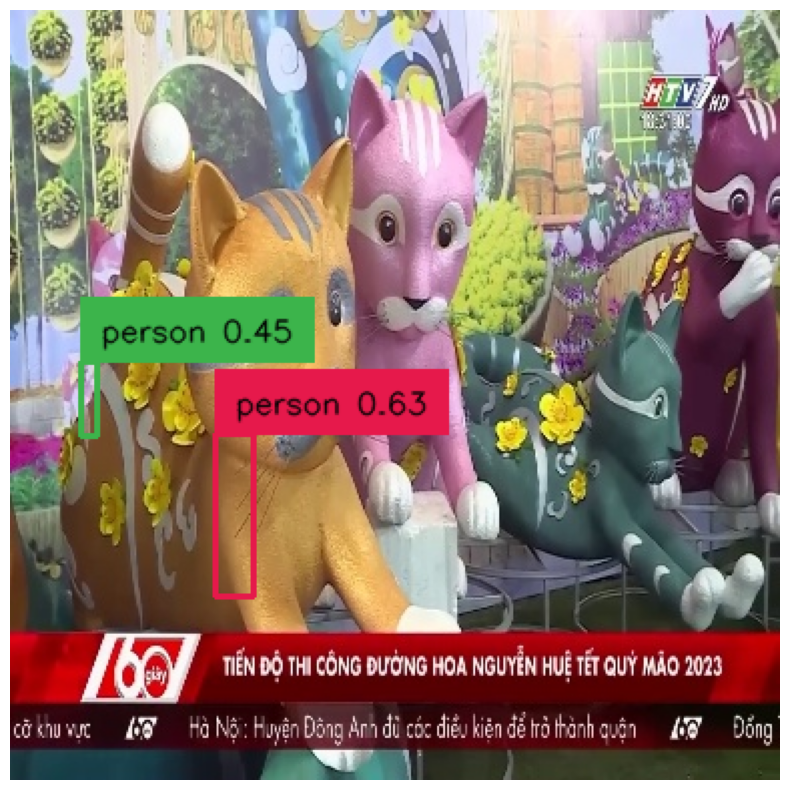


                    QUERY: ('person', 0.35, 0.25),
                    RESULT: ['person', 'person']
                    EDITED PHRASE: ['person', 'person']
                


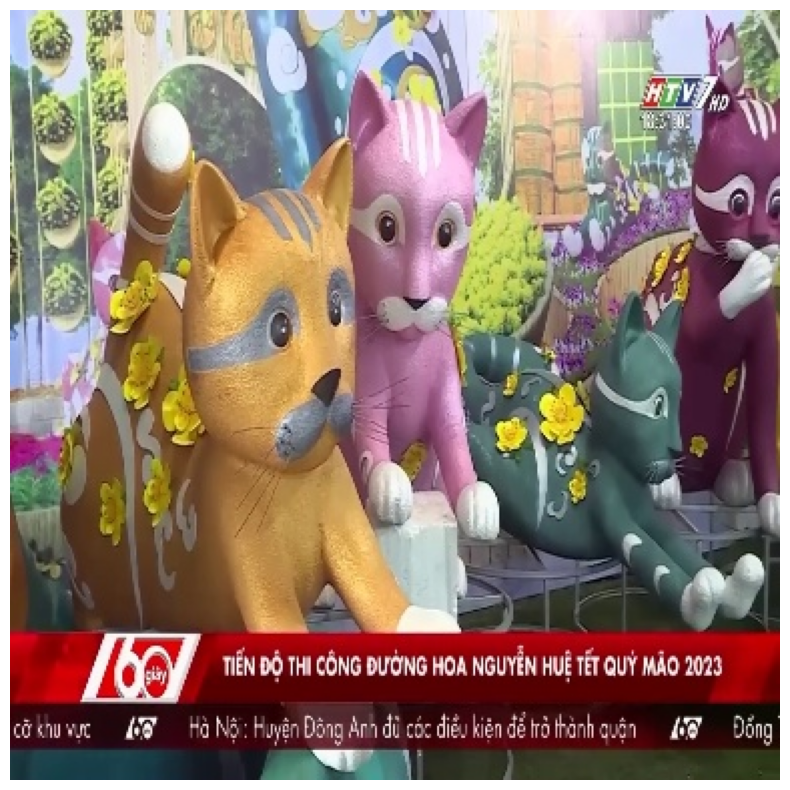


                    QUERY: ('man . beard . bottle . woman . hat . watch', 0.35, 0.25),
                    RESULT: []
                    EDITED PHRASE: []
                


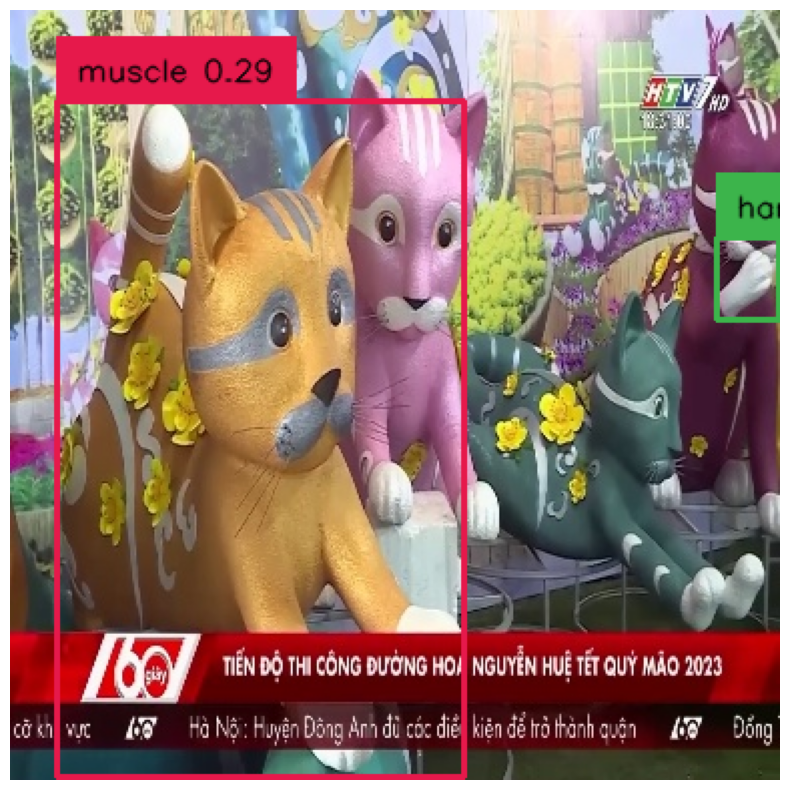


                    QUERY: ('muscle . teeth . banana . sandwich . apple . wine glass . bulb . hand', 0.25, 0.25),
                    RESULT: ['muscle', 'hand']
                    EDITED PHRASE: ['muscle', 'hand']
                


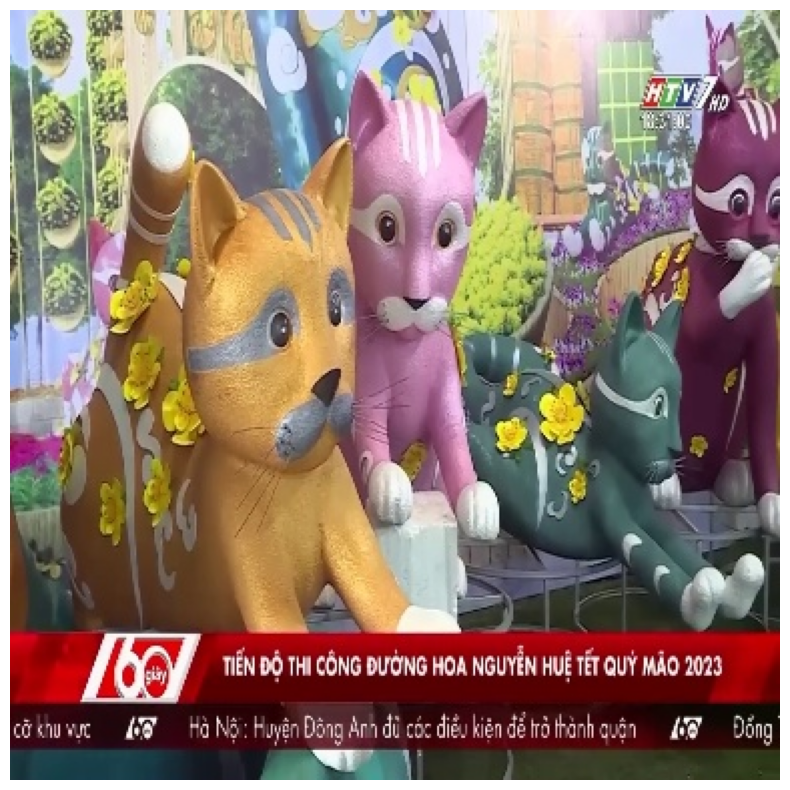


                    QUERY: ('bicycle . boat . bus . fire hydrant . cup . train . mask', 0.3, 0.25),
                    RESULT: []
                    EDITED PHRASE: []
                


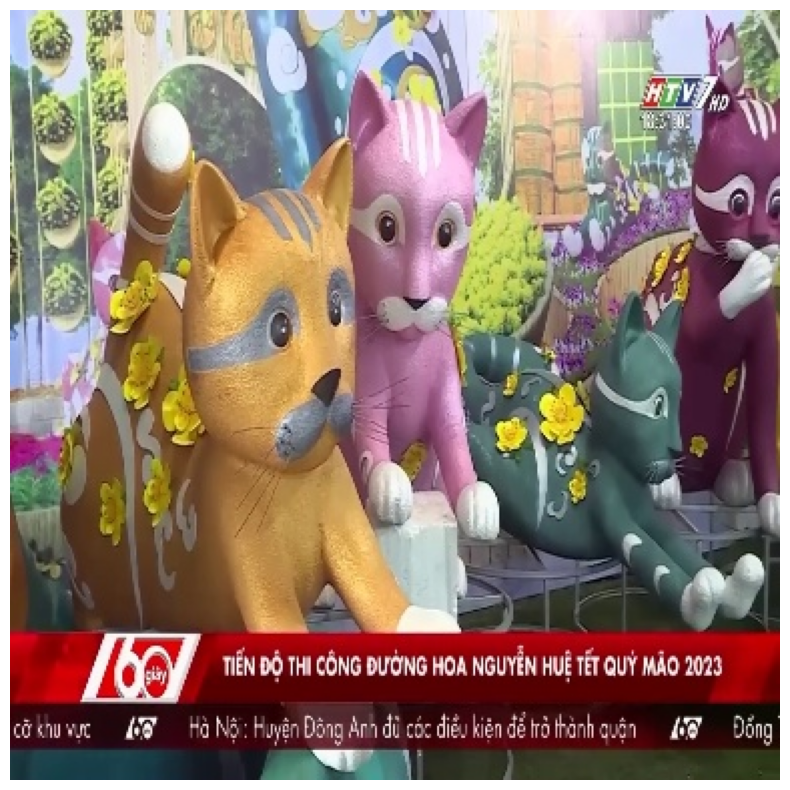


                    QUERY: ('car . motorcycle . stop sign . traffic light . truck . kite . license plate', 0.32, 0.25),
                    RESULT: []
                    EDITED PHRASE: []
                


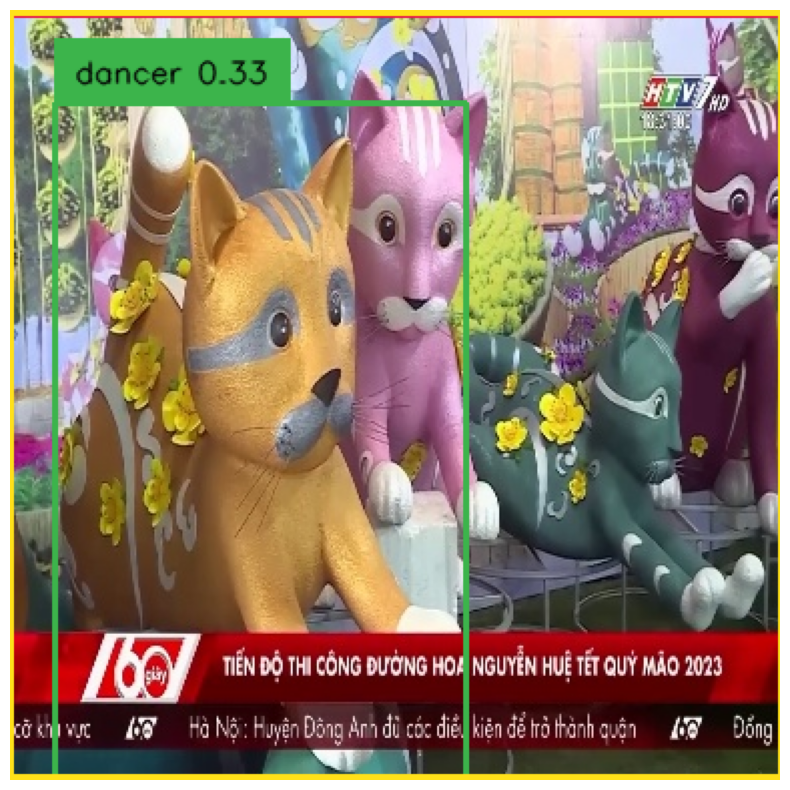


                    QUERY: ('traffic police . engineer . dancer . driver . normal police . doctor', 0.3, 0.25),
                    RESULT: ['normal police', 'dancer', 'traffic police']
                    EDITED PHRASE: ['normal police', 'dancer', 'traffic police']
                


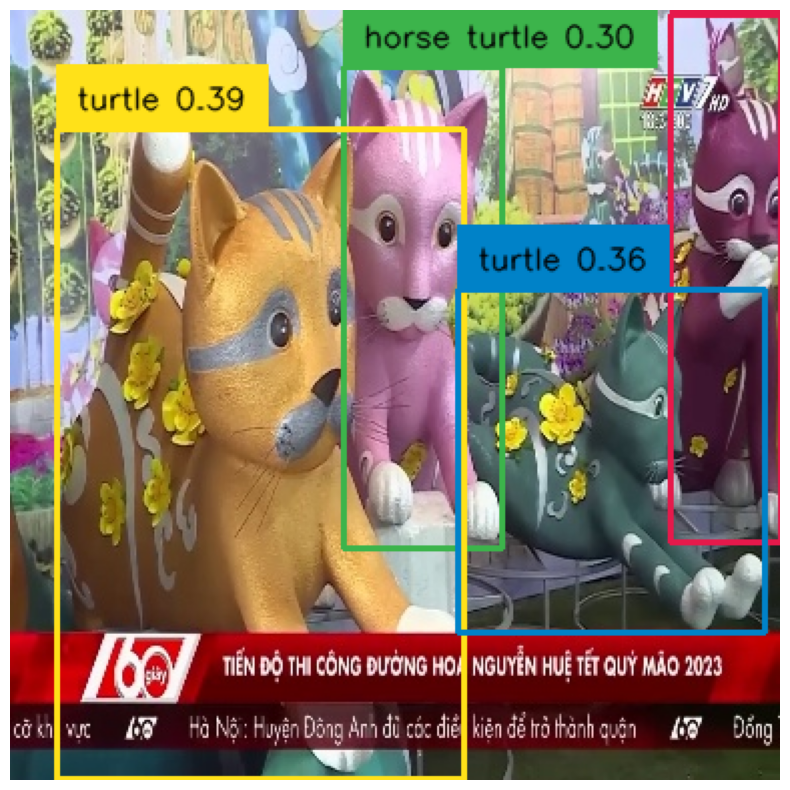


                    QUERY: ('bear . monkey . sheep . elephant . horse . turtle . giraffe', 0.3, 0.25),
                    RESULT: ['horse turtle', 'horse turtle', 'turtle', 'turtle']
                    EDITED PHRASE: ['horse', 'turtle', 'horse', 'turtle', 'turtle', 'turtle']
                


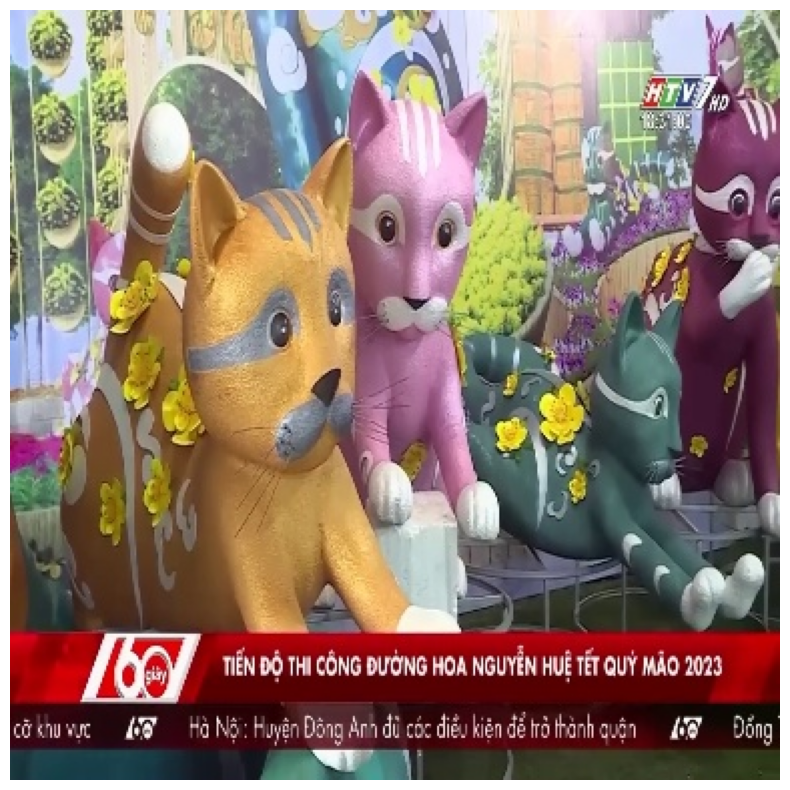


                    QUERY: ('bird . dog . zebra . dolphin . chicken . cow . cat', 0.25, 0.25),
                    RESULT: []
                    EDITED PHRASE: []
                


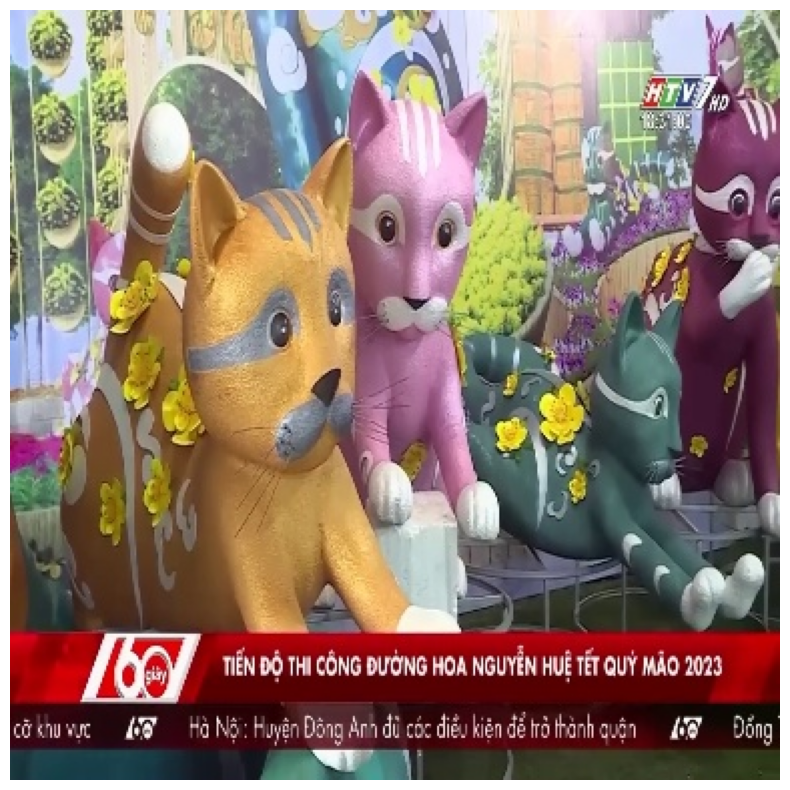


                    QUERY: ('shirt . backpack . bracelet . necklace . tie . suitcase . dress . pants . handbag . umbrella . sunglasses . towel . toothbrush . uniform', 0.25, 0.25),
                    RESULT: []
                    EDITED PHRASE: []
                


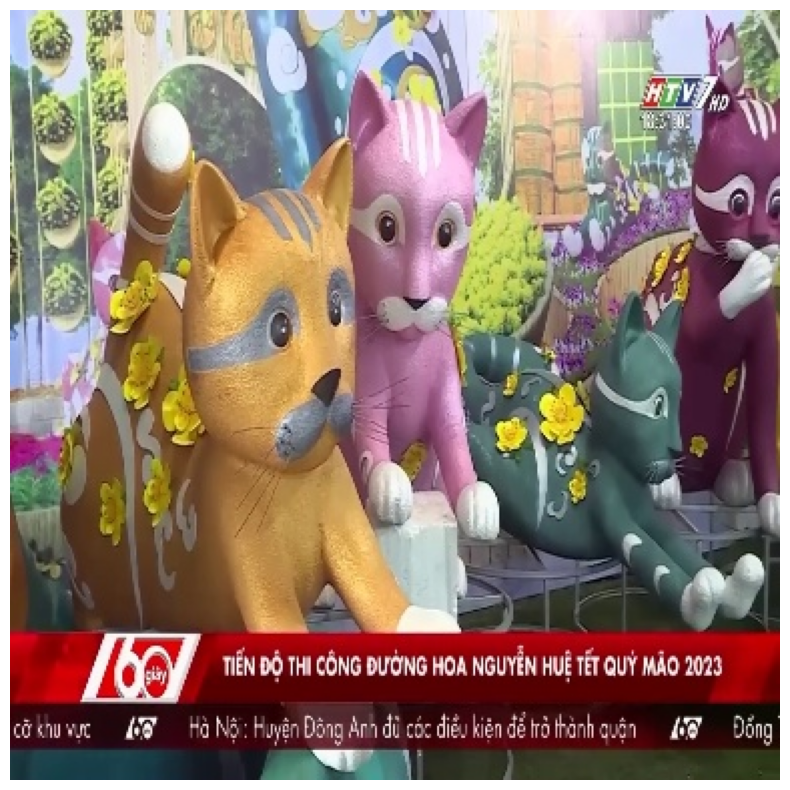


                    QUERY: ('orange . box . can . spoon . cake . broccoli . hot dog . fork . pizza . donut . carrot . dining table . plate . bowl . knife', 0.25, 0.25),
                    RESULT: []
                    EDITED PHRASE: []
                


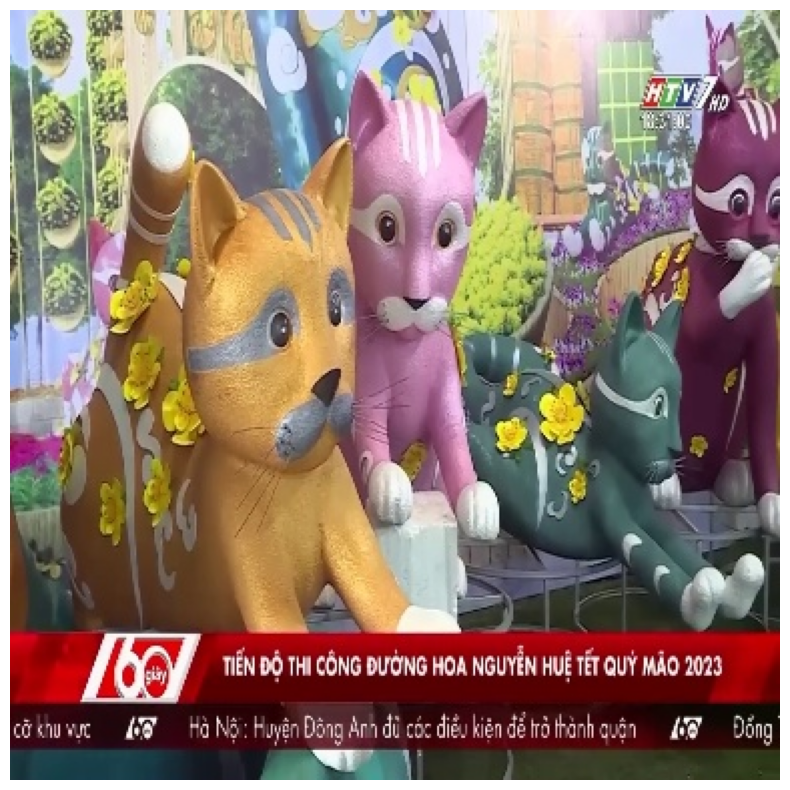


                    QUERY: ('basket . scissors . microwave . shoes . bench . chair . bed . sandals . oven . vase . television', 0.3, 0.25),
                    RESULT: []
                    EDITED PHRASE: []
                


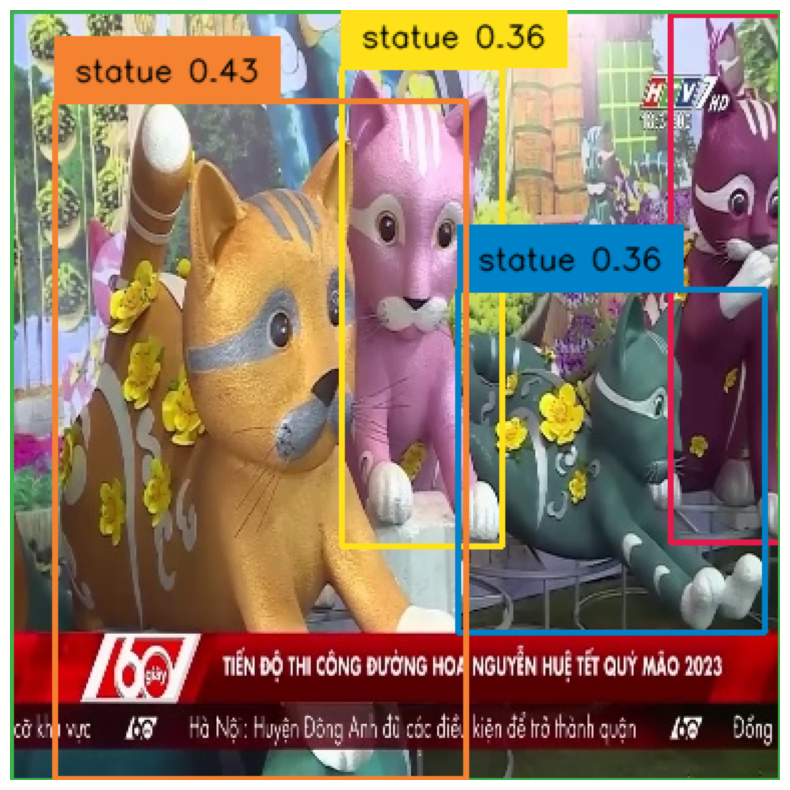


                    QUERY: ('river . house . stair . statue . pig . flag . rock . vietnamese text . sports ball . computer . apartment', 0.35, 0.25),
                    RESULT: ['statue', 'apartment', 'statue', 'statue', 'statue']
                    EDITED PHRASE: ['statue', 'apartment', 'statue', 'statue', 'statue']
                


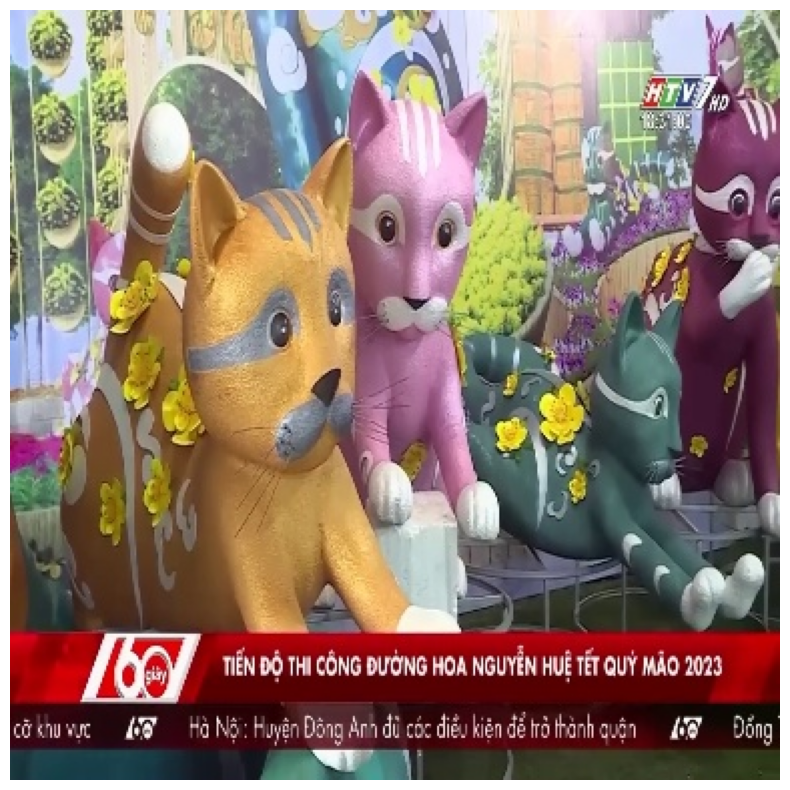


                    QUERY: ('skateboard . baseball bat . glove . potted plant . tennis racket . frisbee . surfboard . clock . flashlight . pen', 0.25, 0.25),
                    RESULT: []
                    EDITED PHRASE: []
                


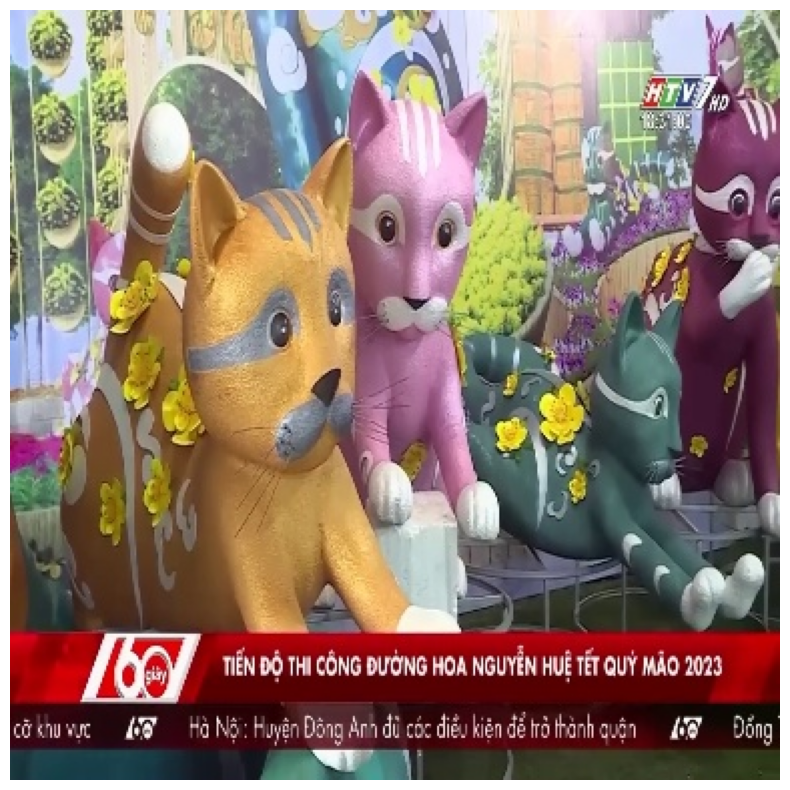


                    QUERY: ('key . cell phone . laptop . remote . keyboard . mouse . microphone . toilet . refrigerator . guitar . drum . machine . hair drier', 0.3, 0.25),
                    RESULT: []
                    EDITED PHRASE: []
                


In [140]:
support_model.test_DINO_output(file_path='/content/drive/MyDrive/AIC_Dataset/Sample/Keyframes_L02/L02_V029/001573.jpg')

In [148]:
# support_model.test_DINO_output(file_path='/content/drive/MyDrive/AIC_Dataset/Sample/Keyframes_L01/L01_V001/004114.jpg')

In [149]:
support_model.extract_obj_from_img_path(folder_path='/content/drive/MyDrive/AIC_Dataset/Sample/Keyframes_L04', save_csv_path='/content/drive/MyDrive/AIC_Dataset/Sample/Keyframes_L04/keyframes_L04.csv', is_save=True)

>>> Checking /content/drive/MyDrive/AIC_Dataset/Sample/Keyframes_L04/L04_V003/000708.jpg ...
>>> Completed: Database/Keyframes_L04/L04_V003/000708.jpg
>>> Checking /content/drive/MyDrive/AIC_Dataset/Sample/Keyframes_L04/L04_V003/000751.jpg ...
>>> Completed: Database/Keyframes_L04/L04_V003/000751.jpg
>>> Checking /content/drive/MyDrive/AIC_Dataset/Sample/Keyframes_L04/L04_V003/001008.jpg ...
>>> Completed: Database/Keyframes_L04/L04_V003/001008.jpg
>>> Checking /content/drive/MyDrive/AIC_Dataset/Sample/Keyframes_L04/L04_V003/001068.jpg ...
>>> Completed: Database/Keyframes_L04/L04_V003/001068.jpg
>>> Checking /content/drive/MyDrive/AIC_Dataset/Sample/Keyframes_L04/L04_V003/001125.jpg ...
>>> Completed: Database/Keyframes_L04/L04_V003/001125.jpg
>>> Checking /content/drive/MyDrive/AIC_Dataset/Sample/Keyframes_L04/L04_V003/001183.jpg ...
>>> Completed: Database/Keyframes_L04/L04_V003/001183.jpg
>>> Checking /content/drive/MyDrive/AIC_Dataset/Sample/Keyframes_L04/L04_V003/001268.jpg ...
>

In [152]:
import pandas as pd
df_kf4 = pd.read_csv('/content/drive/MyDrive/AIC_Dataset/Sample/Keyframes_L04/keyframes_L04.csv')
df_kf4.head(20)


,person,man,woman,traffic police,beard,muscle,teeth,hand,bicycle,motorcycle,...,clock,flashlight,bulb,guitar,drum,machine,pen,vietnamese text,pig,img_paths
0,4,2,2,1,1,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,Database/Keyframes_L04/L04_V003/000708.jpg
1,2,2,1,2,1,0,0,2,0,0,...,0,0,0,0,0,0,3,1,0,Database/Keyframes_L04/L04_V003/000751.jpg
2,2,1,1,1,2,0,0,4,0,0,...,0,0,0,1,0,0,0,0,0,Database/Keyframes_L04/L04_V003/001008.jpg
3,2,1,1,1,0,0,0,4,0,0,...,0,0,0,0,0,0,0,1,0,Database/Keyframes_L04/L04_V003/001068.jpg
4,4,1,1,1,1,0,0,4,0,0,...,0,0,0,0,0,0,0,0,0,Database/Keyframes_L04/L04_V003/001125.jpg
5,2,1,1,1,1,0,0,5,0,0,...,0,0,0,0,0,0,0,1,0,Database/Keyframes_L04/L04_V003/001183.jpg
6,2,1,1,1,0,0,0,4,0,0,...,0,0,0,0,0,0,0,0,0,Database/Keyframes_L04/L04_V003/001268.jpg
7,1,0,0,1,0,2,0,0,0,0,...,0,0,0,0,0,0,0,1,0,Database/Keyframes_L04/L04_V003/001376.jpg
8,10,2,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,Database/Keyframes_L04/L04_V003/001583.jpg
9,13,4,2,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,1,0,Database/Keyframes_L04/L04_V003/001619.jpg


## **LƯU Ý**
Dữ liệu lưu csv đang bị sai 1 cột, để chuyển đổi cột sử dụng đoạn code dưới đây

In [154]:
last_column = df_kf4.columns[-1]
new_df = df_kf4[[last_column] + list(df_kf4.columns[:-1])]
new_df.head(15)
# Ghi dữ liệu từ DataFrame vào file CSV
# new_df.to_csv(file_path, index=False)

,img_paths,person,man,woman,traffic police,beard,muscle,teeth,hand,bicycle,...,potted plant,clock,flashlight,bulb,guitar,drum,machine,pen,vietnamese text,pig
0,Database/Keyframes_L04/L04_V003/000708.jpg,4,2,2,1,1,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
1,Database/Keyframes_L04/L04_V003/000751.jpg,2,2,1,2,1,0,0,2,0,...,0,0,0,0,0,0,0,3,1,0
2,Database/Keyframes_L04/L04_V003/001008.jpg,2,1,1,1,2,0,0,4,0,...,0,0,0,0,1,0,0,0,0,0
3,Database/Keyframes_L04/L04_V003/001068.jpg,2,1,1,1,0,0,0,4,0,...,0,0,0,0,0,0,0,0,1,0
4,Database/Keyframes_L04/L04_V003/001125.jpg,4,1,1,1,1,0,0,4,0,...,0,0,0,0,0,0,0,0,0,0
5,Database/Keyframes_L04/L04_V003/001183.jpg,2,1,1,1,1,0,0,5,0,...,0,0,0,0,0,0,0,0,1,0
6,Database/Keyframes_L04/L04_V003/001268.jpg,2,1,1,1,0,0,0,4,0,...,0,0,0,0,0,0,0,0,0,0
7,Database/Keyframes_L04/L04_V003/001376.jpg,1,0,0,1,0,2,0,0,0,...,0,0,0,0,0,0,0,0,1,0
8,Database/Keyframes_L04/L04_V003/001583.jpg,10,2,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
9,Database/Keyframes_L04/L04_V003/001619.jpg,13,4,2,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,1,0
